# aug 시각화


In [1]:
import albumentations as A
import cv2
import matplotlib.pyplot as plt
import torchvision
import torchvision.transforms

In [2]:
def image_show(image,albu_image):
    fig, ax = plt.subplots(1, 2, figsize=(16, 16))
    ax[0].imshow(image)
    ax[1].imshow(albu_image)
    plt.show()

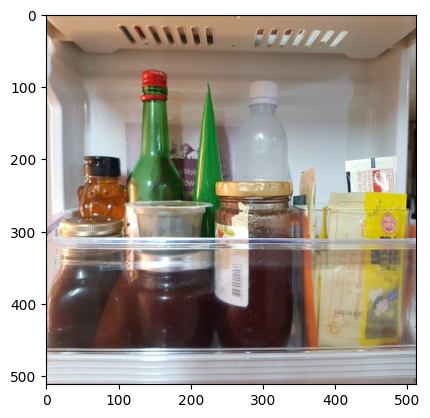

In [3]:
# 기본 이미지
image = cv2.imread("/opt/ml/input/data/batch_01_vt/0002.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

1. ShiftScaleRotate

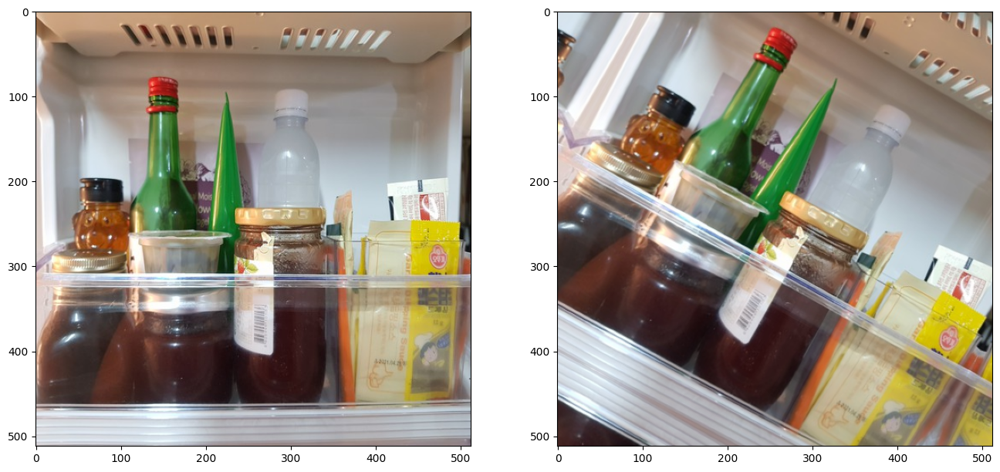

In [56]:
albu_image = A.ShiftScaleRotate(p = 1)(image=image)
image_show(image,albu_image["image"])

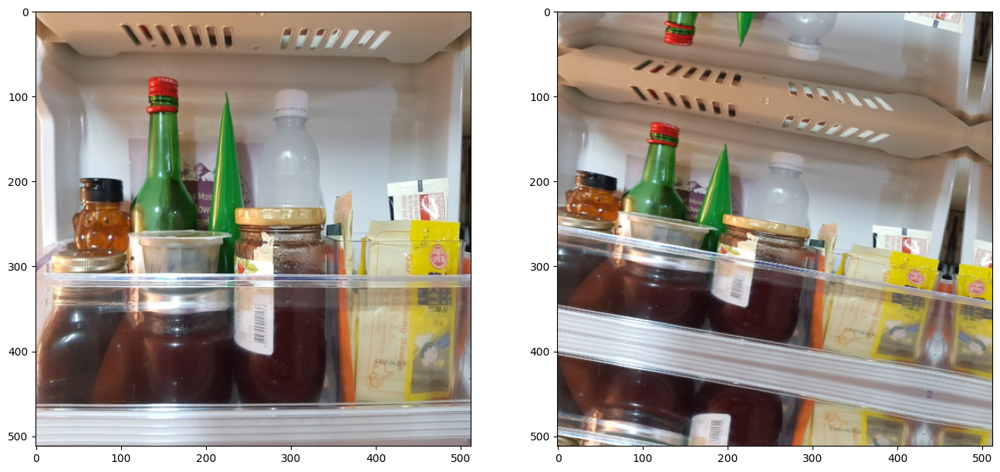

In [62]:
albu_image = A.ElasticTransform(alpha_affine=100, p = 1)(image=image)
image_show(image,albu_image["image"])

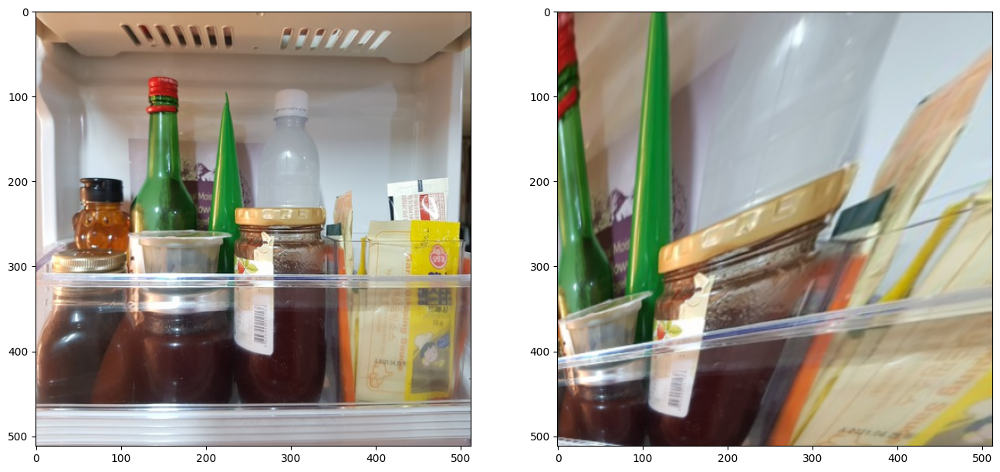

In [97]:
albu_image = A.Perspective(scale = 20, p = 1)(image=image)
image_show(image,albu_image["image"])

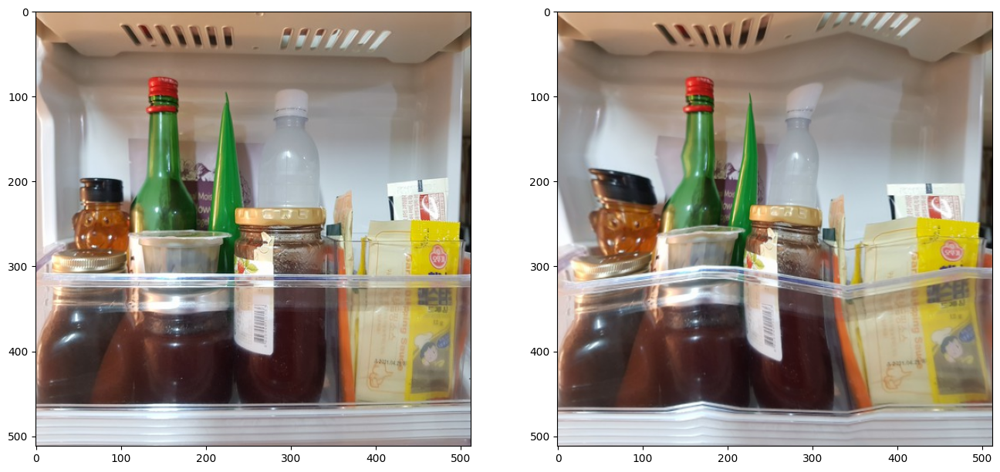

In [99]:
albu_image = A.PiecewiseAffine(p = 1)(image=image)
image_show(image,albu_image["image"])

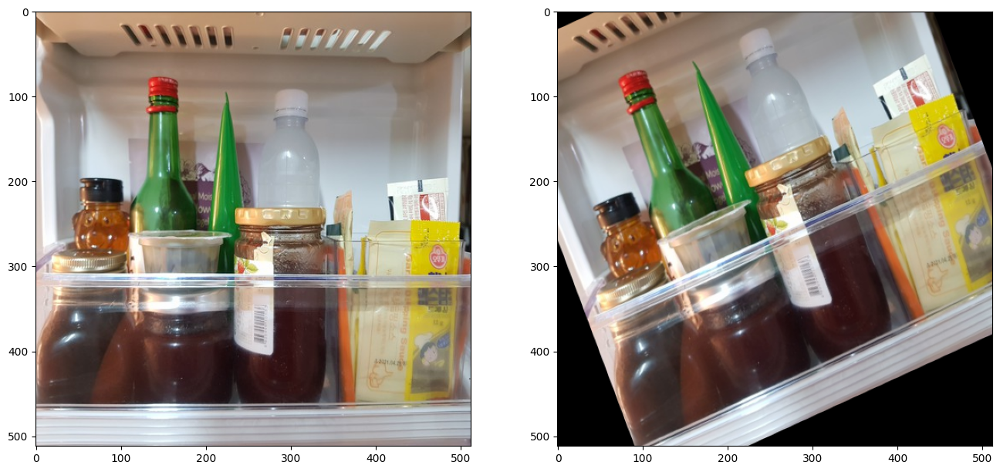

In [101]:
albu_image = A.Affine(p = 1)(image=image)
image_show(image,albu_image["image"])

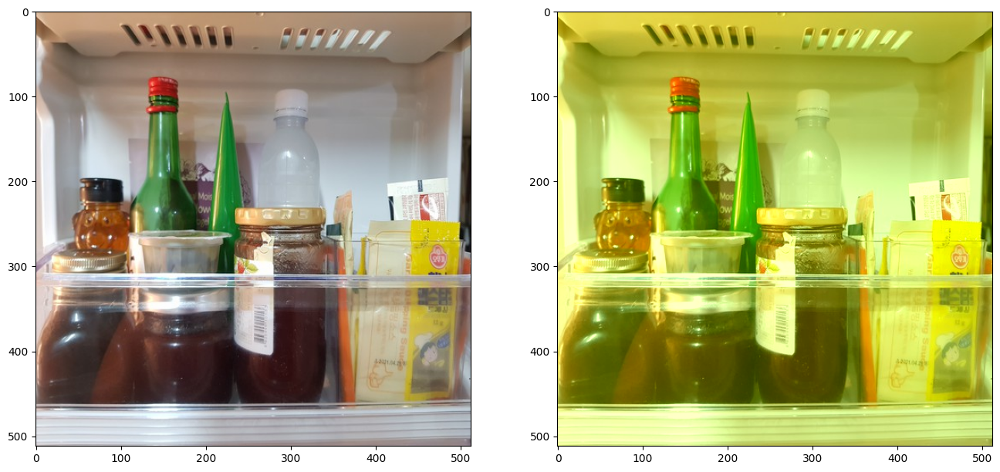

In [103]:
albu_image = A.RGBShift(r_shift_limit=100, g_shift_limit=100, b_shift_limit=100,p = 1)(image=image)
image_show(image,albu_image["image"])

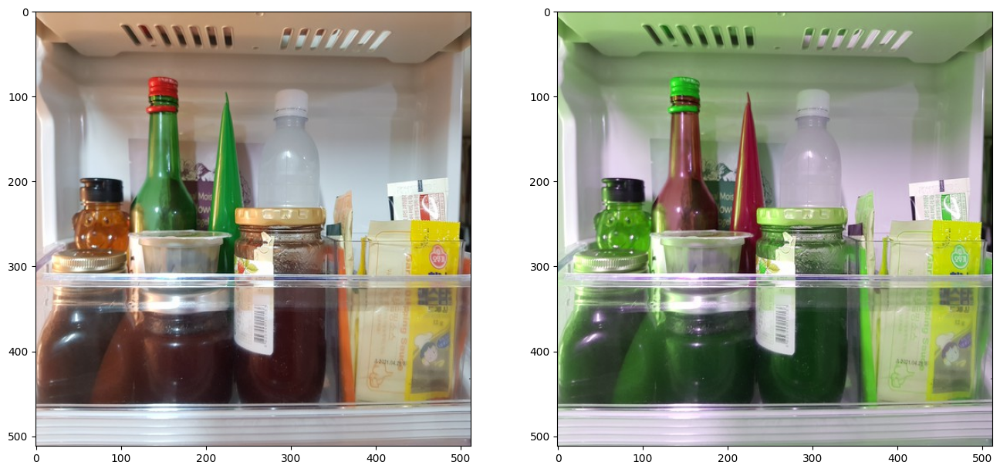

In [104]:
albu_image = A.ChannelShuffle(p = 1)(image=image)
image_show(image,albu_image["image"])

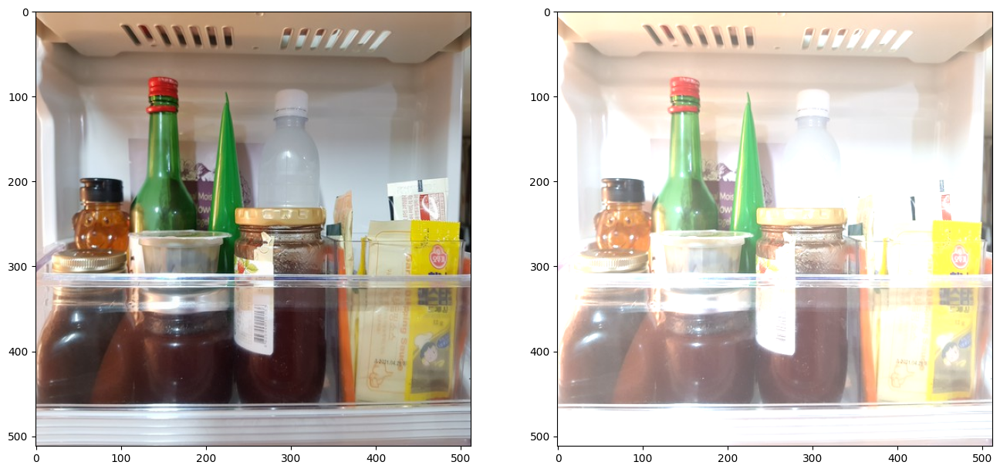

In [107]:
albu_image = A.RandomBrightnessContrast(brightness_limit=0.5,contrast_limit=0.5,p = 1)(image=image)
image_show(image,albu_image["image"])

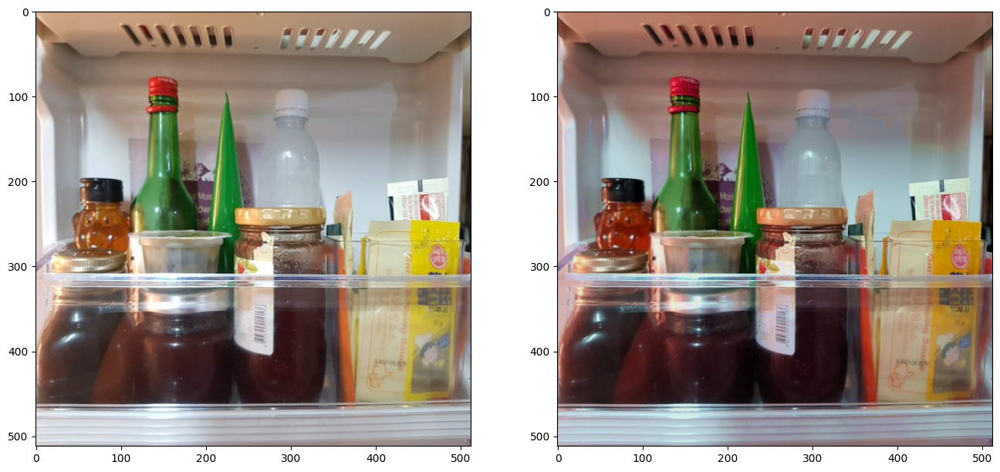

In [108]:
albu_image = A.HueSaturationValue(p = 1)(image=image)
image_show(image,albu_image["image"])

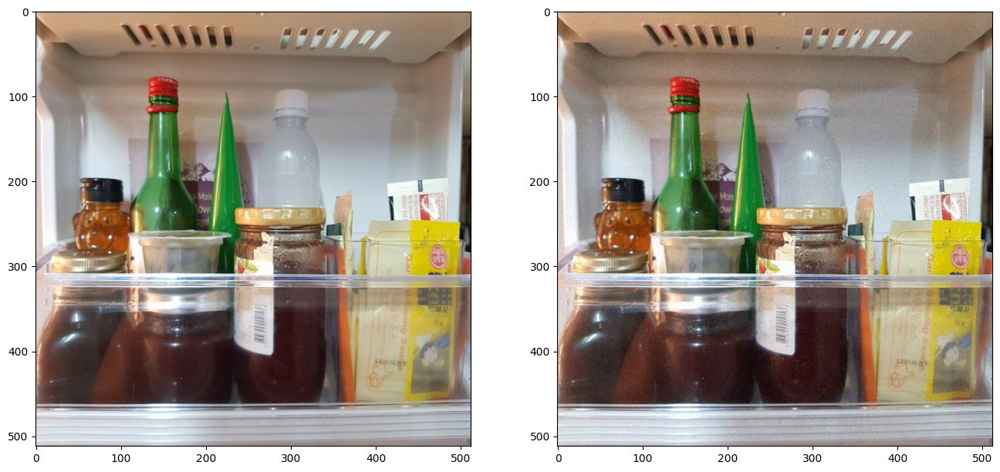

In [109]:
albu_image = A.GaussNoise(p = 1)(image=image)
image_show(image,albu_image["image"])

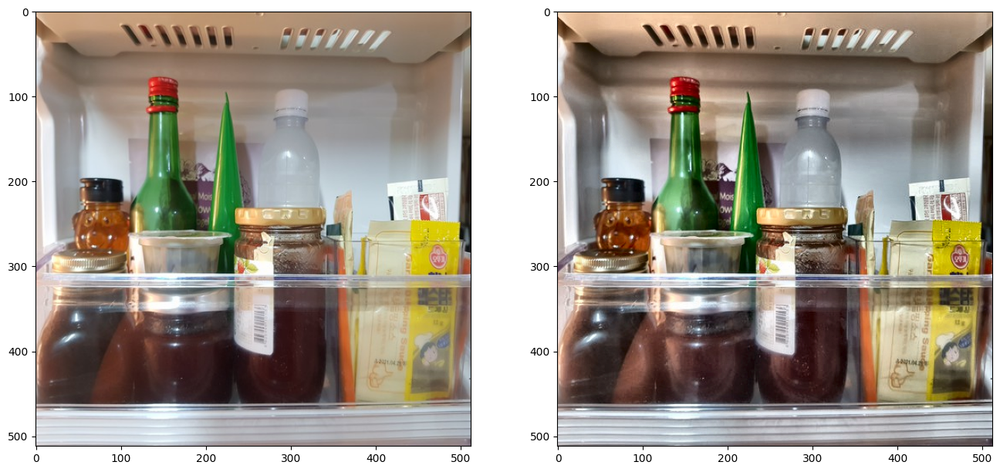

In [110]:
albu_image = A.CLAHE(p = 1)(image=image)
image_show(image,albu_image["image"])

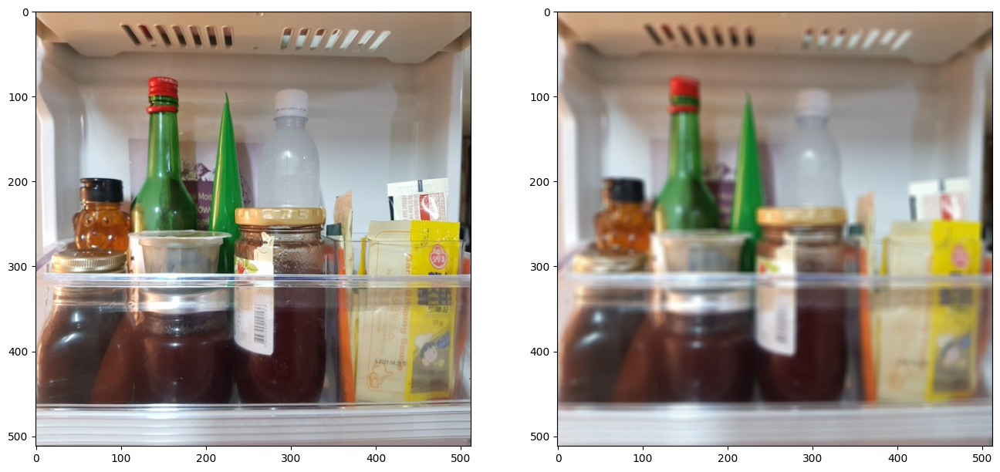

In [111]:
albu_image = A.Blur(p = 1)(image=image)
image_show(image,albu_image["image"])

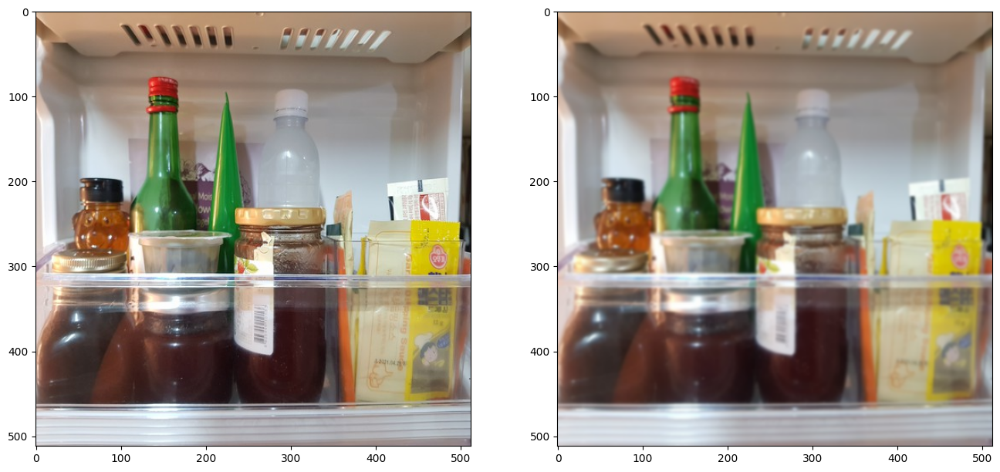

In [112]:
albu_image = A.GaussianBlur(p = 1)(image=image)
image_show(image,albu_image["image"])

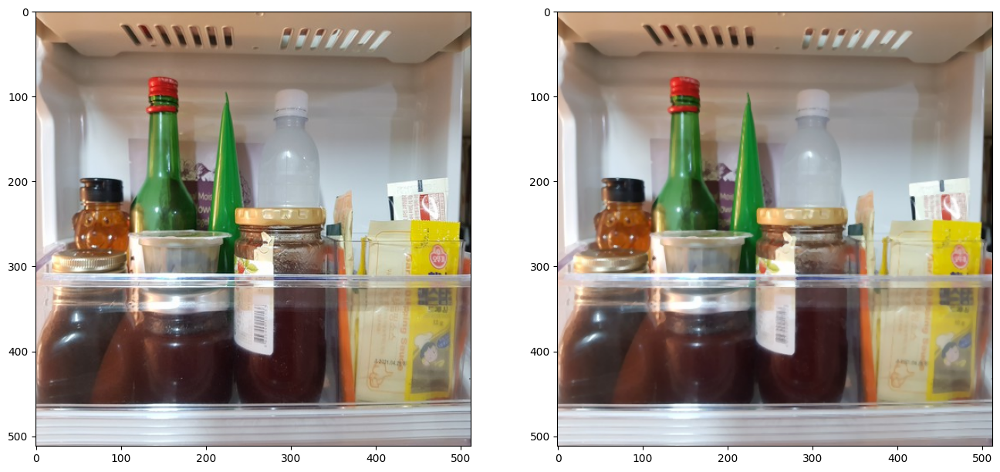

In [113]:
albu_image = A.MedianBlur(p = 1)(image=image)
image_show(image,albu_image["image"])

In [7]:
import random
import mmcv
import numpy as np
class PhotoMetricDistortion(object):
    """Apply photometric distortion to image sequentially, every transformation
    is applied with a probability of 0.5. The position of random contrast is in
    second or second to last.

    1. random brightness
    2. random contrast (mode 0)
    3. convert color from BGR to HSV
    4. random saturation
    5. random hue
    6. convert color from HSV to BGR
    7. random contrast (mode 1)

    Args:
        brightness_delta (int): delta of brightness.
        contrast_range (tuple): range of contrast.
        saturation_range (tuple): range of saturation.
        hue_delta (int): delta of hue.
    """

    def __init__(self,
                 brightness_delta=32,
                 contrast_range=(0.5, 1.5),
                 saturation_range=(0.5, 1.5),
                 hue_delta=18):
        self.brightness_delta = brightness_delta
        self.contrast_lower, self.contrast_upper = contrast_range
        self.saturation_lower, self.saturation_upper = saturation_range
        self.hue_delta = hue_delta

    def convert(self, img, alpha=1, beta=0):
        """Multiple with alpha and add beat with clip."""
        img = img.astype(np.float32) * alpha + beta
        img = np.clip(img, 0, 255)
        return img.astype(np.uint8)

    def brightness(self, img):
        """Brightness distortion."""
        if random.randint(0,1):
            return self.convert(
                img,
                beta=random.uniform(-self.brightness_delta,
                                    self.brightness_delta))
        return img

    def contrast(self, img):
        """Contrast distortion."""
        if random.randint(0,1):
            return self.convert(
                img,
                alpha=random.uniform(self.contrast_lower, self.contrast_upper))
        return img

    def saturation(self, img):
        """Saturation distortion."""
        if random.randint(0,1):
            img = mmcv.bgr2hsv(img)
            img[:, :, 1] = self.convert(
                img[:, :, 1],
                alpha=random.uniform(self.saturation_lower,
                                     self.saturation_upper))
            img = mmcv.hsv2bgr(img)
        return img

    def hue(self, img):
        """Hue distortion."""
        if random.randint(0,1):
            img = mmcv.bgr2hsv(img)
            img[:, :,
                0] = (img[:, :, 0].astype(int) +
                      random.randint(-self.hue_delta, self.hue_delta)) % 180
            img = mmcv.hsv2bgr(img)
        return img

    def __call__(self, results):
        """Call function to perform photometric distortion on images.

        Args:
            results (dict): Result dict from loading pipeline.

        Returns:
            dict: Result dict with images distorted.
        """

        img = results['img']
        # random brightness
        img = self.brightness(img)

        # mode == 0 --> do random contrast first
        # mode == 1 --> do random contrast last
        mode = random.randint(0,1)
        if mode == 1:
            img = self.contrast(img)

        # random saturation
        img = self.saturation(img)

        # random hue
        img = self.hue(img)

        # random contrast
        if mode == 0:
            img = self.contrast(img)

        results['img'] = img
        return results


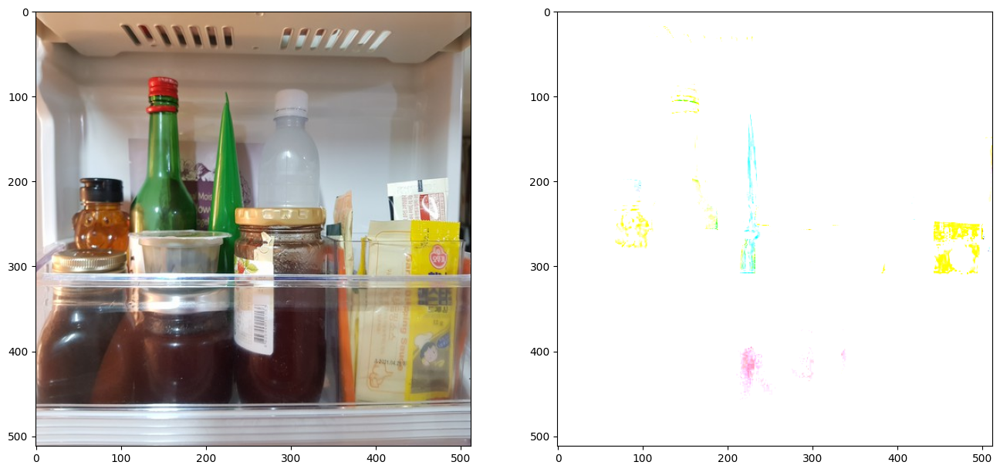

In [9]:
albu_image = PhotoMetricDistortion(
                brightness_delta=128,
                contrast_range=(0, 20),
                saturation_range=(0, 20),
                hue_delta=36)({'img' : image})
image_show(image,albu_image["img"])